# Binary Wet Snow Map Time Series: Mt. Rainier 2020

In [1]:
import geopandas as gpd
import rasterio as rio
import matplotlib.pyplot as plt
import contextily as ctx
import xarray as xr
import rioxarray as rxr
import dask_gateway
sys.path.append('../sar_snowmelt_timing')
import s1_rtc_bs_utils

In [2]:
cluster = dask_gateway.GatewayCluster()
client = cluster.get_client()
cluster.adapt(minimum=2, maximum=100)
print(client.dashboard_link)

https://pccompute.westeurope.cloudapp.azure.com/compute/services/dask-gateway/clusters/prod.c18d6e840ef640a283d788e0a8c37fae/status


# Read in bounding box geojson

In [3]:
name = 'Mt. Rainier, WA'
geojson = '../input/shapefiles/mt_rainier.geojson'     

# Get Sentinel-1 data over the bounding box

In [4]:
bbox_gdf = gpd.read_file(geojson)
ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_pc(bbox_gdf,start_time='2020-01-01',end_time='2020-12-31',polarization='all')

# Check out the xarray dataarray

In [5]:
ts_ds

,Array,Chunk
Bytes,711.07 MiB,1.00 MiB
Shape,"(119, 2, 881, 889)","(1, 1, 511, 511)"
Count,4 Graph Layers,952 Chunks
Type,float32,numpy.ndarray


# Sentinel-1 Overpass Times Context

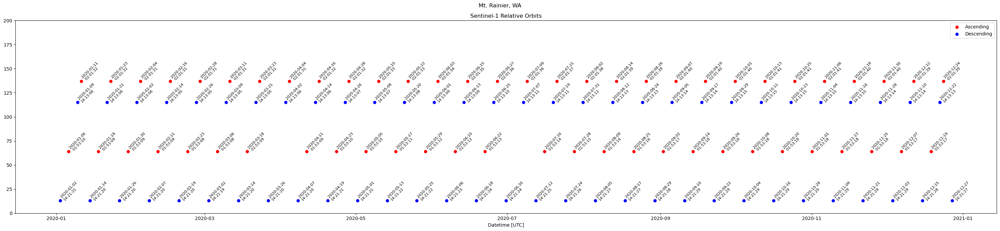

In [6]:
f,ax=plt.subplots(figsize=(30,7))
    
s1_rtc_bs_utils.plot_sentinel1_acquisitons(ts_ds,ax=ax)

f.suptitle(f'{name}')
plt.tight_layout()

# Mask out treecover

In [7]:
classes = [ # page 13 of https://esa-worldcover.s3.amazonaws.com/v100/2020/docs/WorldCover_PUM_V1.0.pdf
#    10, # treecover
    20, # shrubland
    30, # grassland
    40, # cropland
#    50, # built-up
    60, #bare / sparse vegetation
    70, # snow and ice
#    80, # permanent water bodies
    90, # herbaceous wetlands
    95, # mangroves
    100 # loss and lichen
]

In [8]:
worldcover = s1_rtc_bs_utils.get_worldcover(ts_ds)
ts_ds = ts_ds.where(worldcover.isin(classes))

# Convert to dB

In [9]:
ts_ds_db = 10.0*np.log10(ts_ds)

# Now let's find the summertime average backscatter for each orbit and polarization

In [10]:
summer = slice('2020-06-01','2020-09-01')

In [11]:
summer_db = ts_ds_db.sel(time=summer).groupby('sat:relative_orbit').mean()

# Now let's subtract these summer averages from the time series to get ratio images for all polarizations and orbits

In [12]:
ratio_images = ts_ds_db.groupby('sat:relative_orbit')-summer_db

/srv/conda/envs/notebook/lib/python3.10/site-packages/xarray/core/indexing.py:1374: PerformanceWarning: Slicing with an out-of-order index is generating 30 times more chunks
  return self.array[key]


# Let's view a time series of the VV and VH ratio images for the month of December

In [13]:
december = slice('2020-12-01','2020-12-31')

In [14]:
ratio_images_december = ratio_images.sel(time=december).compute()

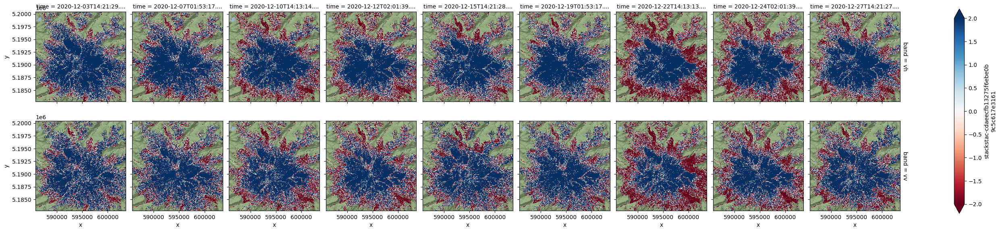

In [15]:
ratio_images_december_plot = ratio_images_december.plot(row='band',col='time',vmin=-2,vmax=2,cmap='RdBu')
for ax in ratio_images_december_plot.axes.flatten():
    ctx.add_basemap(ax=ax, crs=ratio_images_december.rio.crs, source=ctx.providers.Stamen.Terrain, attribution=False)

# Now we can combine the ratio images from the VV and VH polarizations using the method from Nagler et al. 2016 making use of local incidence angle. See https://www.mdpi.com/2072-4292/8/4/348

In [16]:
# Bring in LIA data
local_incidence_angles = s1_rtc_bs_utils.get_s1_rtc_stac(bbox_gdf,
                                                         polarization='incidence',
                                                         collection='../input/sentinel1-rtc-aws/mycollection_rainier.json')

In [17]:
# Take the LIA mean per relative orbit
mean_local_incidence_angles = local_incidence_angles[local_incidence_angles['sat:relative_orbit'].isin(ratio_images['sat:relative_orbit'])].groupby('sat:relative_orbit').median() #is mean best to use here?

In [18]:
# Write crs to LIA raster and reproject to match ratio images
mean_local_incidence_angles = mean_local_incidence_angles.rio.write_crs(local_incidence_angles.crs)
lia = mean_local_incidence_angles.rio.reproject_match(ratio_images)

In [19]:
# Remove scaling factor
lia = lia/100

In [20]:
# mask out LIA <15 and >75
lia = lia.where((lia>15) & (lia<75))

Text(0.5, 1.05, 'Local incidence angle rasters per relative orbit')

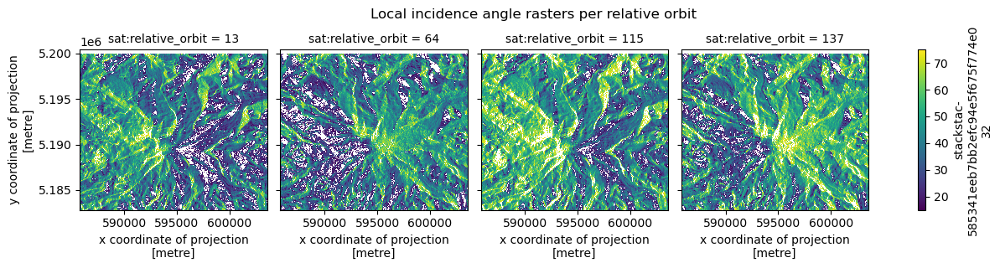

In [21]:
# Lets look at the masked LIA rasters
lia.plot(col='sat:relative_orbit')
plt.suptitle('Local incidence angle rasters per relative orbit',y=1.05)

In [22]:
# Constants to be used in the weights calculation
k = 0.5
theta1 = 20
theta2 = 45

In [23]:
# Weights calculation per relative orbit
W = xr.where(lia<theta1,1,k*(1 + ((theta2-lia)/(theta2-theta1)) ) )
W = xr.where(lia>theta2,k,W)

Text(0.5, 1.05, 'Weight (W) values per relative orbit')

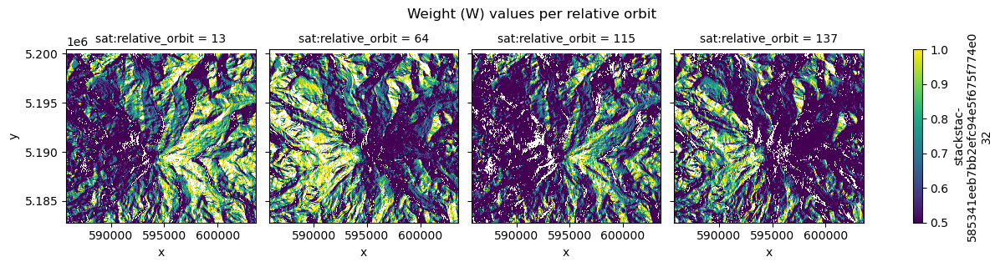

In [24]:
# View weights, note the bad incidence angles masked out
W.plot(col='sat:relative_orbit')
plt.suptitle('Weight (W) values per relative orbit',y=1.05)

# Now that we've calculated the weights, let's combine the VV and VH ratio images and resample to 100m

In [25]:
# Rc calculation
Rc = W*ratio_images.sel(band='vh').groupby('sat:relative_orbit') + (1-W)*ratio_images.sel(band='vv').groupby('sat:relative_orbit') 

In [26]:
# Resample to 100m, using median resampling
Rc = Rc.rio.write_crs(lia.rio.crs)
Rc_100 = Rc.rio.reproject(Rc.rio.crs, resolution=100, resampling=rio.enums.Resampling.med)

# Now threshold the images using a threshold of -2dB

In [27]:
binary_wet_snow = xr.where(Rc_100<-2,1,np.nan)

# Remove single outlier pixels

In [28]:
# 3x3 median filter:toggle min_periods, should change to 1 for single pixel outlier
binary_wet_snow = binary_wet_snow.rolling({"x":3,"y":3},center=True,min_periods=2).median()

# Let's view a time series of binary wet snow maps for all of 2020 to see if it makes sense

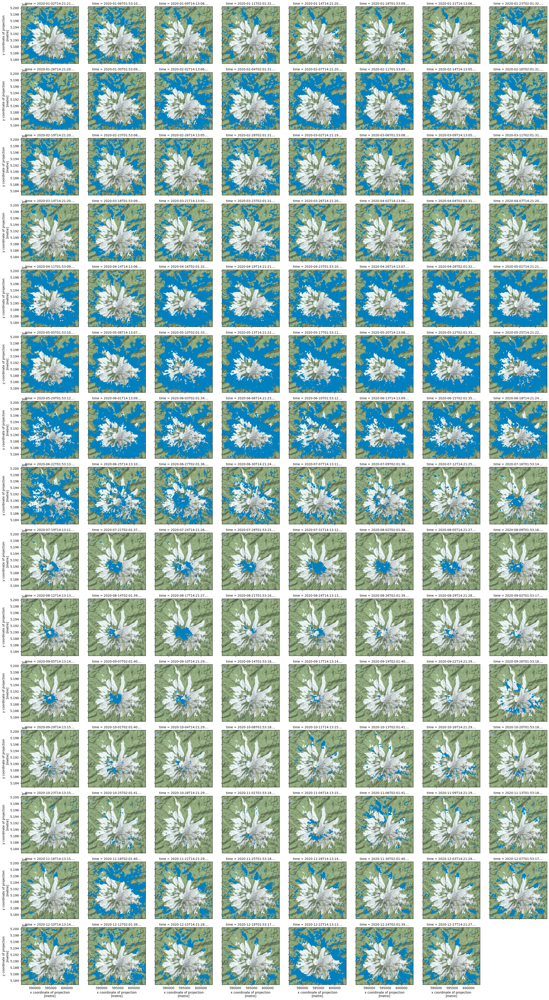

In [29]:
binary_wet_snow_plot = binary_wet_snow.plot(col='time',vmin=1,add_colorbar=False,col_wrap=8,cmap='winter')
for ax in binary_wet_snow_plot.axes.flatten():
    ctx.add_basemap(ax=ax, crs=binary_wet_snow.rio.crs, source=ctx.providers.Stamen.Terrain, attribution=False)